In [1]:
#plot from the large numpy file containing lots of runs

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from __future__ import print_function
import numpy as np
#from tqdm import tqdm
import matplotlib.colors as colors
import matplotlib.pyplot as plt
from matplotlib.dates import DateFormatter
from matplotlib import cm
plt.rcParams.update({'font.size': 14, 'lines.markersize' : 4})
from scipy.interpolate import interp1d
from scipy.optimize import curve_fit
import sys, os
import time, datetime
from datetime import timedelta
import pandas as pd
sys.path.append('/reg/neh/home/tdd14/modules/cart2pol/cart2pol')
import cart2pol
from cart2pol import PolarRebin
from torchrecon_funcs_cal import *

In [3]:
from matplotlib import cm
from matplotlib.colors import ListedColormap
my_cmap = cm.get_cmap('jet')
xr = np.linspace(0, 1, 2000)
my_cmap = my_cmap(xr)
my_cmap[0:2,-1] = 0
my_cmap = ListedColormap(my_cmap)

In [4]:
def gaus(x, a, mu, sig):
    return a*1/sig/np.sqrt(2*np.pi)*np.exp(-0.5*((x-mu)/sig)**2)


def gaus_fit(t,spec):
    #spec = Et*Et.conj()
    popt, pcov = curve_fit(gaus,t,spec, bounds=([0.1, -50, 0.01], [100, 50, 30]))
    a, mu, sig = popt
    return a, mu, sig #FWHM is 2.355*sig


In [5]:
# def FWHM(t, spec): 
#     peakMax = np.max(spec)
#     indMax = np.where(spec == peakMax)[0]
#     t1 = 0
#     t2 = 0
    
#     for i in range(int(len(t)/2)):
#         if t2 != 0 and t1 != 0:
#             break
#         if indMax+i  == len(t)-1 and t2 == 0:
#             t2 = t[indMax+i]
#         if indMax-i  == 0 and t1 == 0:
#             t1 = t[0-i]
#         if indMax + i < len(t)-1: 
#             if spec[indMax + i] <= 0.5*peakMax and t2 == 0:
#                 t2 = t[indMax + i]
#         if indMax - i >= 0:
#             if spec[indMax - i] <= 0.5*peakMax and t1 == 0:
#                 t1 = t[indMax - i]  
#     return t2-t1

def FWHM(t, spec): 
    peakMax = np.max(spec)
    spec = np.roll(spec, int(len(spec)/2)-np.argmax(spec)) 
    indMax = np.where(spec == peakMax)[0] #should be center since rolled
    if len(indMax)>1: indMax = np.max(indMax)
    t1 = 0
    t2 = 0
    
    for i in range(int(len(t)/2)):
        if t2 != 0 and t1 != 0:
            break
        if i < indMax: 
            if spec[i] >= 0.5*peakMax and t1 == 0:
                t1 = t[i]
            if spec[-i] >= 0.5*peakMax and t2 == 0:
                t2 = t[-i]  
    return t2-t1

In [6]:
def FWHM2(t, spec): 
    spec = spec/np.sum(spec)
    peakMax = np.max(spec)
    indMax = np.where(spec == peakMax)[0] 
    if len(indMax)>1: indMax = np.max(indMax)
    else: indMax = indMax[0]
    t1 = 0
    t2 = 0
    ind1 = 0
    ind2 = 0
    
    for i in range(int(len(t))):
        if t2 != 0 and t1 != 0:
            break
        if i < indMax:
            #print(i, np.trapz(spec[-i:]))
            
            if (np.trapz(spec[:i]) >= 0.25) & (t1 == 0):
                t1 = t[i]
                ind1 = i
            elif (np.trapz(spec[-(i+1):]) >= 0.25) & (t2 == 0):
                t2 = t[-(i+1)]  
                ind2 = -(i+1)
    return t2-t1 #, ind1, ind2

In [7]:
basesdir = '/reg/d/psdm/tmo/tmox51020/results/paris/circularpol_vNbases_dipole_Feb/'
PR = PolarRebin('/reg/d/psdm/tmo/tmox51020/results/paris/recon/PR_c32_r32_th32.h5') 

In [54]:
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Feb22_0.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Feb25_long.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Feb27_long_nohole_2.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Mar1_long_2.npy' #feb29 is not a real date
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Mar2_long.npy' #feb29 is not a real date
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Mar7_0-1eV.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Mar7_0.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Mar8_0.npy'
#fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Mar14_0_4.npy'
# fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul5_sim.npy'
# #fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul7_sim.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul9_sim.npy'
# fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul10_sim.npy'
# fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul12_sim_sm.npy'
#fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul12_sim.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Jul13_sim.npy'
fname = '/reg/d/psdm/tmo/tmox51020/results/paris/recon/torch_Aug31_simver.npy'
dats = np.load(fname, allow_pickle = True)[()]

In [55]:
dats.keys()

dict_keys(['dat', 'mask', 'mdatname', 'specdatname', 'gfsig', 'eshift', 'sc', 'trueQsname', 'trueUpsname', 'thresh'])

In [56]:
dat = dats['dat']
mask = dats['mask']
#maskhm = dats['maskhm']
mdatname = dats['mdatname']
specdatname = dats['specdatname']
trueQsname = dats['trueQsname']
trueUpsname = dats['trueUpsname']
gfsig = dats['gfsig']
eshift = dats['eshift']
thresh = dats['thresh']
print(eshift)
sc = dats['sc']
print(sc)
gfcart = 0.25
print(mdatname)

0
1
/cds/home/p/paris/reconVMI_clean/recon X510 Dec/Ms_Aug31_0.npy


In [57]:
mdat= np.load(mdatname , allow_pickle = True)[()]
specdat = np.load(specdatname, allow_pickle = True)[()]
trueQs = np.load(trueQsname, allow_pickle = True)[()]
trueUps = np.load(trueUpsname, allow_pickle = True)[()]

In [31]:
Ups = np.unique(dat['Up'])
print(Ups)

[0.1 0.2 0.3 0.5 1. ]


In [32]:
try: Bps
except:
    Bps = []
    alphas = []
    vNaxiss = []
    alphaws = []
    alphats = []
    Bnames = []
    Upsall = []
N_w = 6
N_t = 6
Nb = N_w*N_t
for i in range(len(Ups)):
    Np = 128
    Up = Ups[i]  
    if Up == 0: Up = int(0)
    filename = 'Bpbasis_Np' + str(Np) + '_Nw' + str(N_w) +'_Nt' + str(N_t) + '_Up' + str(Up)+'.npy'
    print(filename)
    if filename in Bnames: continue
    br = np.load(basesdir+filename, allow_pickle=True)
    Breal = br[()]['Breal']
    Bimag = br[()]['Bimag']
    breal = br[()]['breal']
    bimag = br[()]['bimag']
    vNaxis = br[()]['vNaxis']
    alpha = br[()]['alpha']

    
    tempr = np.zeros((Breal.shape[0], 64**2))
    tempi = np.zeros((Breal.shape[0], 64**2))
    for i in range(len(Breal)):
        tempr[i,:] = np.reshape(rebin(np.reshape(Breal[i,:], [128,128])), [64**2])
        tempi[i,:] = np.reshape(rebin(np.reshape(Bimag[i,:], [128,128])), [64**2])

    Breal = tempr
    Bimag = tempi

    # alphw = np.zeros(alpha['t_sample'].shape, dtype = complex)
    # for i in range(len(alphw)):
    #     f = interp1d(vNaxis['t_sample'], alpha['t_sample'][i], fill_value = 0, bounds_error = False)
    #     N = 2801 #1024
    #     ts = np.linspace(vNaxis['t_sample'][0],-vNaxis['t_sample'][0], N)
    #     alphw[i] = np.fft.ifftshift(np.fft.ifft(f(ts)))
    alphw = np.zeros(alpha['t_sample'].shape, dtype = complex)
    alpht = np.zeros(alpha['t_sample'].shape, dtype = complex)
    for i in range(len(alphw)):
        f = interp1d(vNaxis['t_sample'], alpha['t_sample'][i], fill_value = 0, bounds_error = False)
        N = 2801 #1024
        ts = np.linspace(vNaxis['t_sample'][0],-vNaxis['t_sample'][0], N)
        a = f(ts)
        #a = f(vNaxis['t_sample'])
        alpht[i] = a
        alphw[i] = np.fft.ifftshift(np.fft.ifft(a))


    Np = 64
    for j in range(Breal.shape[0]):
        temp=np.reshape(Breal[j,:],[Np,Np])
        polimg = PR.cart2pol(temp,32,32)
        bb = np.zeros((64,64))
        bb[1:64,1:64]= PR.pol2cart(scimg.filters.gaussian_filter(polimg,[gfsig,0]))
        Breal[j,:]=np.reshape(bb,newshape=(1,Np**2))
        #temp=scimg.filters.gaussian_filter(temp,0.8889)
        #Bpr[j,:]=Variable(Tensor(np.reshape(temp,newshape=(1,Np**2))))
        temp=np.reshape(Bimag[j,:],[Np,Np])
        polimg = PR.cart2pol(temp,32,32)
        bb = np.zeros((64,64))
        bb[1:64,1:64]= PR.pol2cart(scimg.filters.gaussian_filter(polimg,[gfsig,0]))
        Bimag[j,:]=np.reshape(bb,newshape=(1,Np**2))
        #temp=scimg.filters.gaussian_filter(temp,0.8889)
        #Bpi[j,:]=Variable(Tensor(np.reshape(temp,newshape=(1,Np**2))))

    Bp_basis = Breal+1j*Bimag
    Bnames.append(filename)
    Bps.append(Bp_basis)
    alphas.append(alpha)
    vNaxiss.append(vNaxis)
    alphaws.append(alphw)
    alphats.append(alpht)
    Upsall.append(Up)

Bpbasis_Np128_Nw6_Nt6_Up0.1.npy
Bpbasis_Np128_Nw6_Nt6_Up0.2.npy
Bpbasis_Np128_Nw6_Nt6_Up0.3.npy
Bpbasis_Np128_Nw6_Nt6_Up0.5.npy
Bpbasis_Np128_Nw6_Nt6_Up1.0.npy


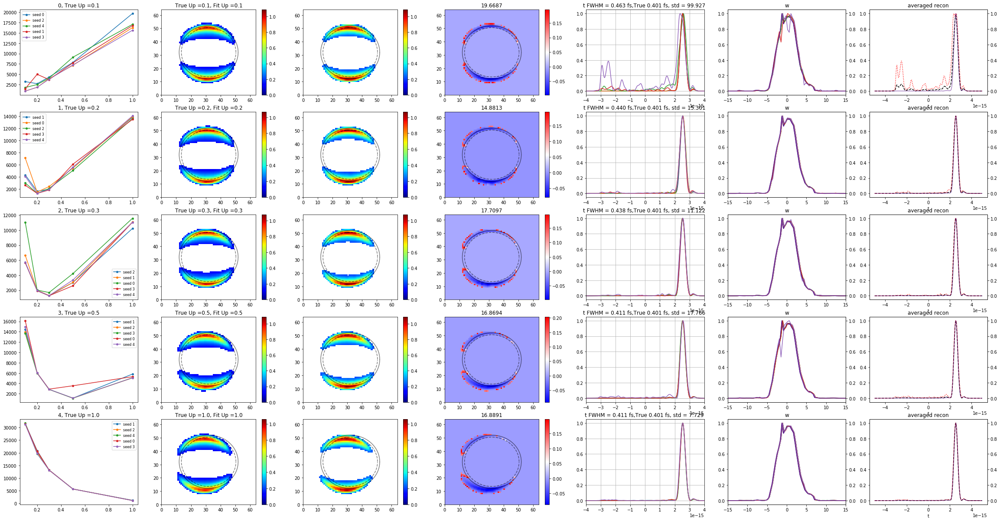

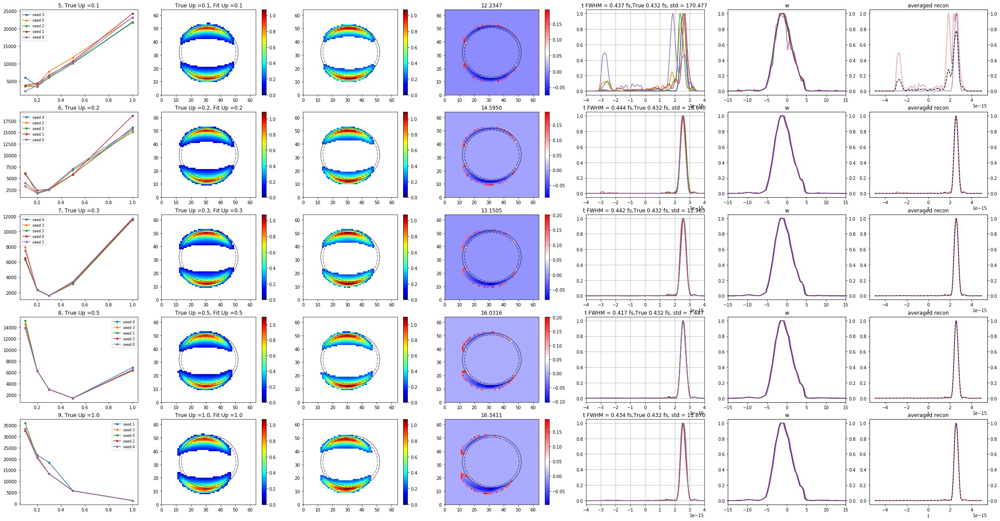

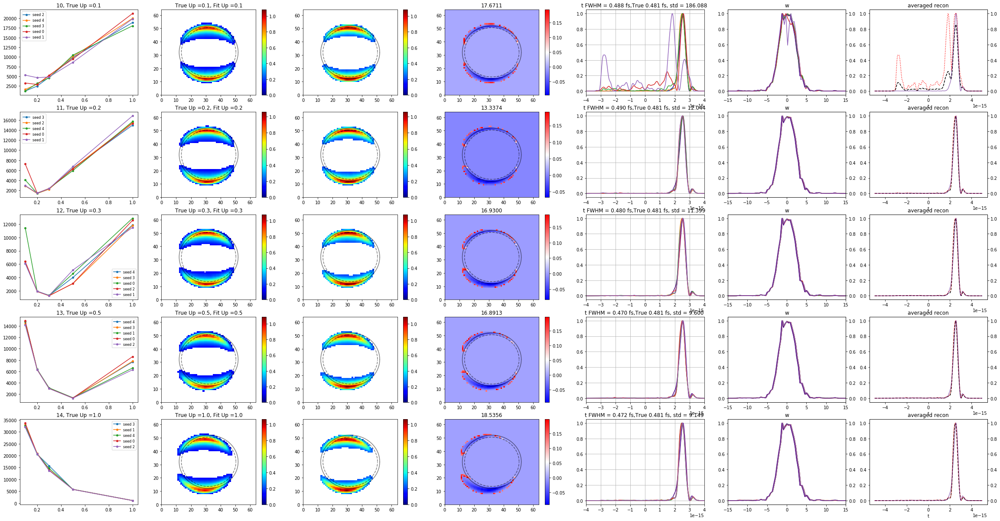

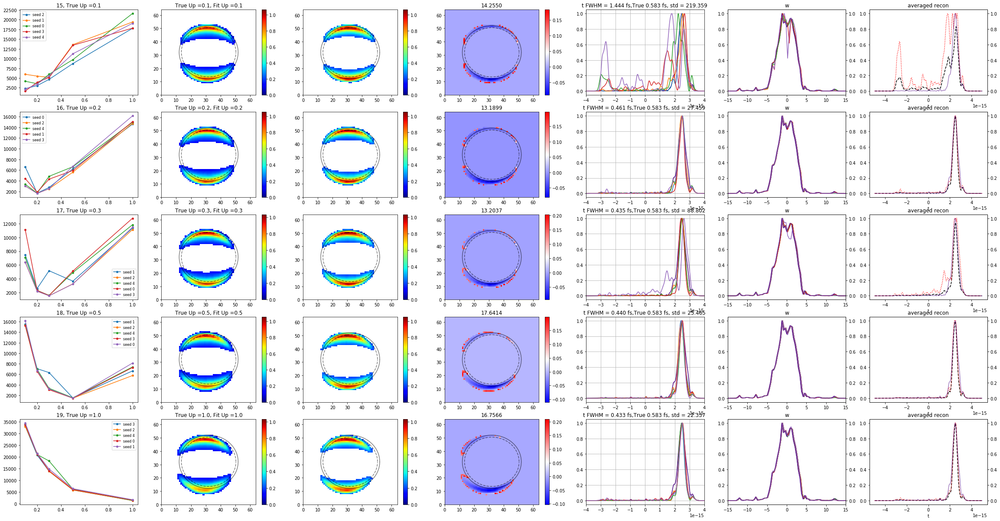

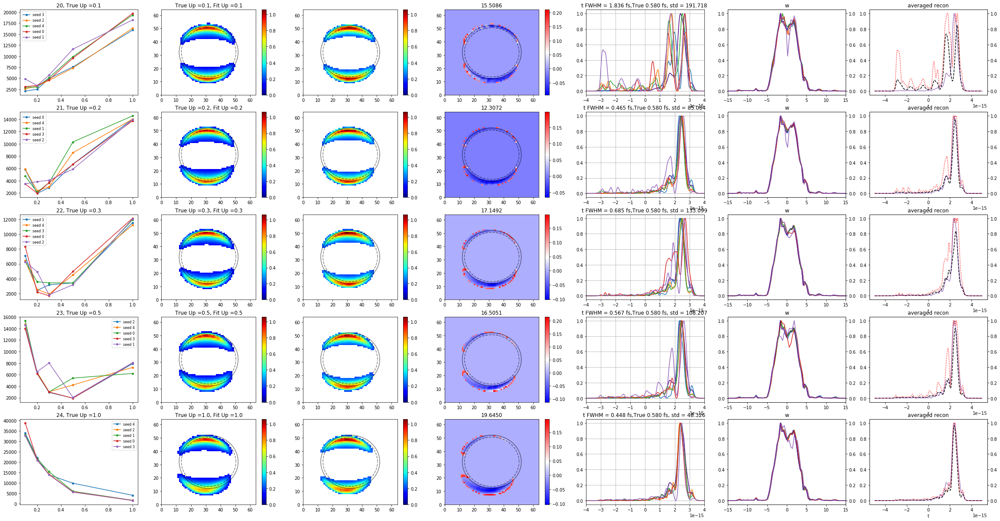

...

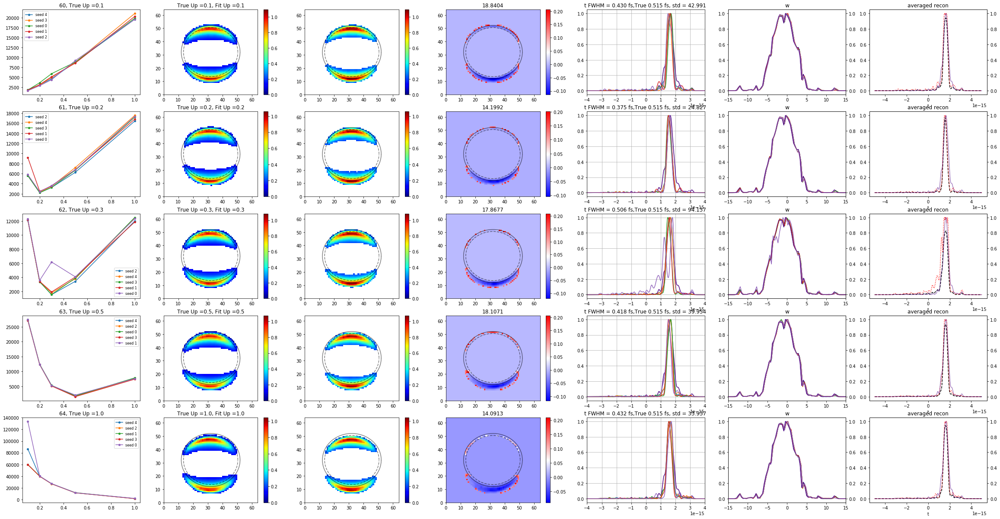

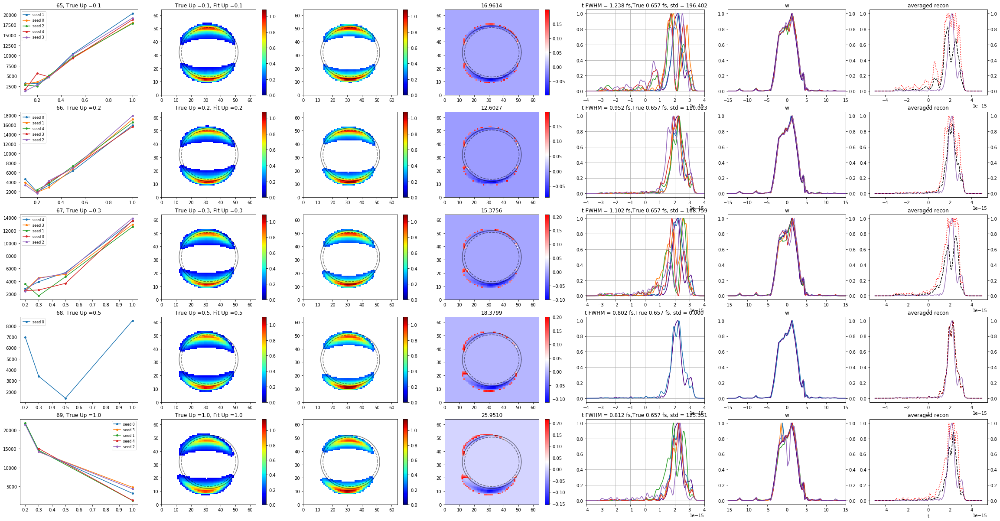

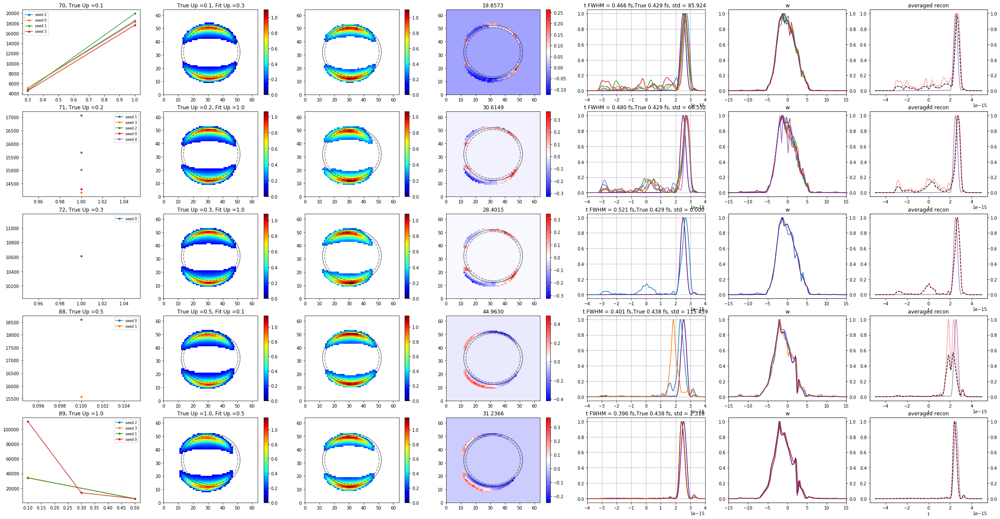

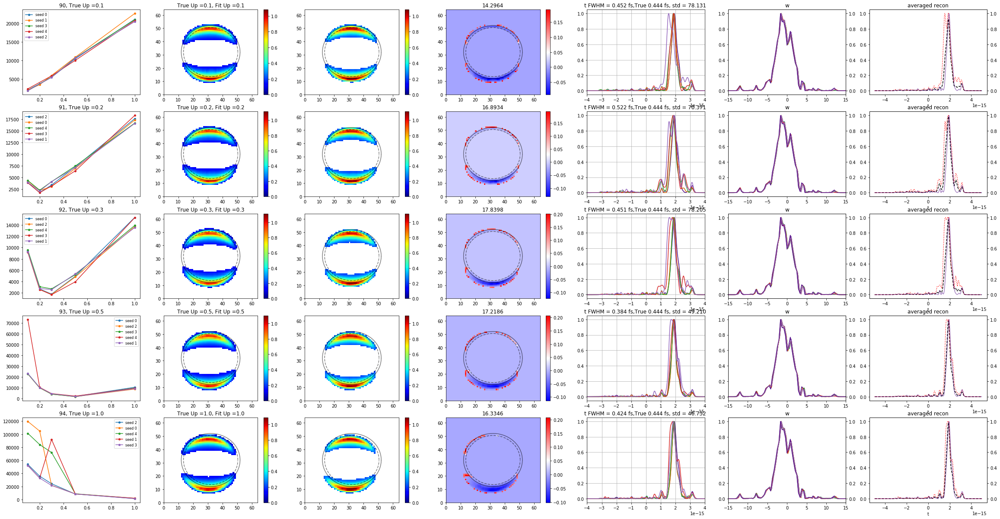

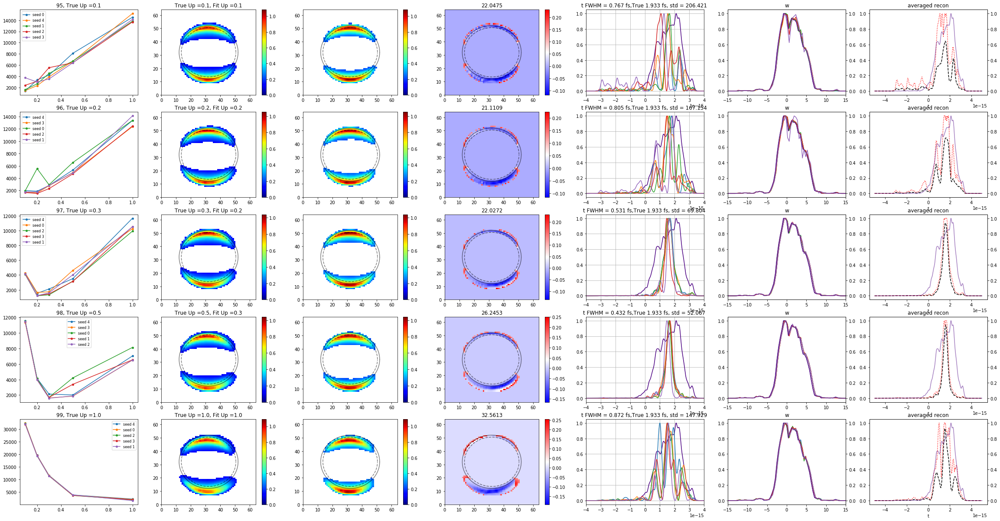

In [58]:
#plot for ppt
fwhms = []
fwhms_avg = []
fwhms_maxs = []
fwhms2 = []
fwhms2_maxs = []
fwhms_t = []
fwhms2_t = []
ups_t = []
ups_b = []
fwhms_tup_fit = []
std_t = []
std_t_no_w = []
std_w = []
fwhms_likely = []
fwhms_likely2 = []

#thresh = dats['thresh']
eshift = np.unique(dat['eshift'])
IDs = np.unique(dat['ID'])
for k in range(int(np.ceil(len(IDs)/5))):
    fig,axs = plt.subplots(nrows = 5, ncols =7, figsize = (40,21))
    for l in range(5):
        uplook = dat[(dat['ID'] == IDs[k*5+l])]['Up'][np.argmin(dat[(dat['ID'] == IDs[k*5+l])]['costs'][:,-1])]
        u = int(np.where(Ups == uplook)[0])
        #seed_order = np.argsort(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['costs'][:,-1])
        seeds = np.unique(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['seed'])
        #seed_order = np.arange(len(seeds))
        seed_order = np.argsort(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['costs'][:,-1])
        duration = []
        duration2 = []
        ets = []
        ews =[]
        for ss in range(len(seeds)):   
        
            x = dat[(dat['ID'] == IDs[k*5+l])&(dat['seed'] == seeds[seed_order[ss]])]['Up']
            y= dat[(dat['ID'] == IDs[k*5+l])&(dat['seed'] == seeds[seed_order[ss]])]['costs'][:,-1]
            #y= dat[(dat['ID'] == IDs[k])]['costM'][:,-1]
            axs[l][0].plot(x[np.argsort(x)], y[np.argsort(x)], '-o', label = 'seed %1.0f' %seeds[seed_order[ss]])
            
           
        
        Bp = Bps[u]
        vNaxis = vNaxiss[u]
        alpha = alphas[u]
        alphw = alphaws[u]
        ts=vNaxis['t_sample']


        m = mdat[IDs[k*5+l]]
       # m[m<32] = 0
        spec = specdat[IDs[k*5+l]]
        m = m/np.sum(m)
        N = 2801
        xf = np.arange(-N/2-1/2,N/2-1/2,1)/np.abs(vNaxis['t_sample'][0])/2 #((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0]))
        eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 
        # N = 2801
        # xf = np.arange(-N/2+1/2,N/2+1/2,1)/((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0])) #using tsample range
        # eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 
        #Interpolate spec outside of the loop to match eV
        xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
        xeV = xeV - eshift#3 #know this from previous calibration

        for s in range(len(seeds)):
            
            if len(seeds)>1:
                Q = np.squeeze(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['Qs'][seeds[seed_order[s]],:])
            else:
                Q = np.squeeze(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['Qs'])
            N_basis = 36
            eVshift_idx = 0
            Q1=Q[0:N_basis]
            Q1=np.reshape(Q1,[1,N_basis])
            Q2=np.concatenate(([0],Q[N_basis:2*N_basis-1]))
            Q2=np.reshape(Q2,[1,N_basis])
            Qguess=Q1+1j*Q2
            Qguess=np.reshape(Qguess,[N_basis,1])
            Mgr=np.real(np.matmul(np.matmul(Qguess,Qguess.conj().transpose()).transpose().flatten(),Bp))
            Mgr=Mgr/np.sum(Mgr)
           # Mgr[Mgr<0.0005] = 0
            Mgr[Mgr<thresh] = 0
            Mgr=Mgr/np.sum(Mgr)

            alpha_t = alpha['t_sample']/np.max(np.abs(alpha['t_sample'])) ##take out carrier
            #alpha_t = alpha['t']/np.max(np.abs(alpha['t'])) #alpha_t = alpha_t*np.exp(-1.j*(energy_x)/hbar*np.tile(vNaxis['t'],(N_basis,1)))
            Et = np.squeeze(np.matmul(Qguess.T,alpha_t))

            f = interp1d(vNaxis['t_sample'],Et, fill_value = 0, bounds_error = False)
            Et_l = f(np.linspace(vNaxis['t_sample'][0],-vNaxis['t_sample'][0], len(vNaxis['t_sample'])))
            aghh = np.argmax(np.abs(Et_l))
            Ew = np.fft.ifftshift(np.fft.ifft(np.roll(Et_l,-aghh))) #need this to get imag part, must be evenly spaced
            #Ew = np.squeeze(np.matmul(Qguess.T,alphw))
            EwEw = np.real(Ew*Ew.conj())
            EwEw = EwEw[1340-eVshift_idx:-1340-eVshift_idx]
            EwEw = EwEw/np.max(EwEw)
            wphase = np.unwrap(np.angle(Ew))
            wphase = wphase - np.mean(wphase)
            Ew = np.squeeze(np.matmul(Qguess.T,alphw)) 
            EwEw = np.real(Ew*Ew.conj())
            EwEw = EwEw[1340-eVshift_idx:-1340-eVshift_idx]
            EwEw = EwEw/np.max(EwEw)

            ews.append(EwEw)

            phis = np.linspace(0,359,100)*np.pi/180
            if s == 0:

                pscale = 1/np.max(m/np.sum(m*mask))
                Mt = m/np.sum(m*mask)*pscale
                Mp = pscale*np.reshape(Mgr/np.sum(mask*np.reshape(Mgr, [64,64])), [64,64])
                #tosave[str(k) + '_Q'] = Q
                #tosave[str(k) + '_Up'] = uplook
                p =axs[l][1].pcolormesh(Mt, cmap = my_cmap,vmax = np.max([np.max(Mp),1]))
                axs[l][1].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
                axs[l][1].plot(32+ 18.5*np.cos(phis), 32+ 18.5*np.sin(phis), 'k--', alpha = 0.5)
                plt.colorbar(p, ax = axs[l][1])
                axs[l][1].set_title('True Up ='+str(trueUps[IDs[k*5+l]])+', Fit Up ='+str(uplook))
                
                
                axs[l][0].set_title(str(IDs[k*5+l])+', True Up ='+str(trueUps[IDs[k*5+l]]))
                axs[l][0].legend(fontsize = 8)
                
                
                p =axs[l][2].pcolormesh(Mp, cmap = my_cmap, vmax = np.max([np.max(Mp),1]))#, vmin = np.min(m), vmax = np.max(m))
                plt.colorbar(p, ax = axs[l][2])
                phis = np.linspace(0,359,100)*np.pi/180
                axs[l][2].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
                axs[l][2].plot(32+ 18.5*np.cos(phis), 32+ 18.5*np.sin(phis), 'k--', alpha = 0.5)

                merr = m*mask
                merr= merr/np.sum(merr)
                mgrerr = mask*np.reshape(Mgr, [64,64])
                mgrerr = mgrerr/np.sum(mgrerr)
                p = axs[l][3].pcolormesh(pscale*(merr-mgrerr), cmap = 'bwr')
                axs[l][3].set_title('%1.4f' %np.sum(np.abs((pscale*(merr-mgrerr)))))
                #p = axs[2].pcolormesh(m-np.reshape(Mgr, [64,64]), cmap = 'bwr')
                axs[l][3].plot(32+ 20*np.cos(phis), 32+ 20*np.sin(phis), 'k-', alpha = 0.5)
                axs[l][3].plot(32+ 18.5*np.cos(phis), 32+ 18.5*np.sin(phis), 'k--', alpha = 0.5)
                plt.colorbar(p, ax = axs[l][3])

                f = interp1d(xeV,spec, bounds_error=False, fill_value = 0)
                spec_in = f(eV[1340:-1340])

                spec_in=spec_in/np.max(spec_in)
                # ax1 = axs[l][6].twinx()
                # ax1.plot(eV[1340:-1340], spec_in, color= 'indigo', alpha = 0.5)
                ax = axs[l][5].twinx()
                ax.plot(eV[1340:-1340], spec_in, color= 'indigo', alpha = 0.5)
                
                Qt = trueQs[IDs[k*5+l]]
                Ett = np.squeeze(np.matmul(Qt.T,alpha_t))
                EttEtt = np.abs(Ett*Ett.conj())
                EttEtt = EttEtt/np.max(EttEtt)
                axs[l][4].plot(ts, EttEtt,label = 'True EtEt*', color = 'indigo')
                ax1 = axs[l][6].twinx()
                ax1.plot(ts, EttEtt, color= 'indigo', alpha = 0.5)
                roll_to = np.argmax(EttEtt)
                # a,mu,sig = gaus_fit(ts*1e15,np.roll(EttEtt, int(len(EttEtt)/2)-roll_to))
                # fwhms_t.append(2.355*sig)
                fwhms_t.append(FWHM(ts*1e15, np.roll(EttEtt, int(len(EttEtt)/2)-roll_to)))
                fwhms2_t.append(FWHM2(ts*1e15, np.roll(EttEtt, int(len(EttEtt)/2)-roll_to)))
                ups_t.append(trueUps[IDs[k*5+l]])
                ups_b.append(uplook)

                Ewt = np.squeeze(np.matmul(Qt.T,alphw)) 
                EwtEwt = np.abs(Ewt*Ewt.conj())
                EwtEwt = EwtEwt/np.max(EwtEwt)
                axs[l][5].plot(eV, EwtEwt, label = 'True EwEw*', color = 'indigo')

                

            axs[l][5].set_title('w')
            #axs[l][4].set_title('t')
            axs[l][5].plot(np.linspace(eV[1340],eV[-1340], len(EwEw)), np.squeeze(EwEw))
            ax.set_ylim(axs[l][5].get_ylim())
            EtEt = np.abs(Et*Et.conj())
            EtEt = EtEt/np.max(EtEt)
            axs[l][4].plot(ts, EtEt,label = 'seed %1.0f' %seeds[seed_order[s]])
            
            axs[l][4].set_xlim(-4e-15,4e-15)
            roll_to = np.argmax(EtEt)
            # a,mu,sig = gaus_fit(ts*1e15,np.roll(EtEt, int(len(EtEt)/2)-roll_to))
            # duration.append(2.355*sig)
            duration.append(FWHM(ts*1e15, np.roll(EtEt, int(len(EtEt)/2)-roll_to)))
            duration2.append(FWHM2(ts*1e15,np.roll(EtEt, int(len(EtEt)/2)-roll_to)))
            ets.append(EtEt)
            
#             axs[l][6].set_title('w phase')

#             axs[l][6].plot(eV[1340-eVshift_idx:-1340-eVshift_idx], wphase[1340-eVshift_idx:-1340-eVshift_idx])
#             if s == 0: ymin,ymax = np.min(wphase[1340-eVshift_idx:-1340-eVshift_idx][30:90]),np.max(wphase[1340-eVshift_idx:-1340-eVshift_idx][30:90])
#             if s>0: 
#                 if np.min(wphase[1340-eVshift_idx:-1340-eVshift_idx][30:90]) < ymin: ymin = np.min(wphase[1340-eVshift_idx:-1340-eVshift_idx][30:90])
#                 if np.max(wphase[1340-eVshift_idx:-1340-eVshift_idx][30:90]) > ymax: ymax = np.max(wphase[1340-eVshift_idx:-1340-eVshift_idx][30:90])
#             axs[l][6].set_ylim(ymin,ymax)
#             if s == len(seeds)-1: axs[l][4].legend(fontsize = 8)
#         axs[l][6].set_xlim(-10,10)
            
        likely = []
        for nn in range(len(ets)):
            dot = []
            for nl in range(len(ets)):
                if nn != nl:
                    dot.append(np.dot(ets[nn]/np.linalg.norm(ets[nn]),ets[nl]/np.linalg.norm(ets[nl])))
            likely.append(np.sum(dot))
                
        fwhms_likely.append(FWHM(ts*1e15, np.roll(ets[np.argmax(likely)], int(len(EtEt)/2)-np.argmax(EtEt))))    
        fwhms_likely2.append(FWHM2(ts*1e15, np.roll(ets[np.argmax(likely)], int(len(EtEt)/2)-np.argmax(EtEt))))    
           
        worst = np.argmin(likely) 
        std_t_no_w.(np.sum(np.std(np.array(ets)[np.arange(len(ets)) != worst],axis = 0)))
    
        axs[l][4].grid()
        axs[l][5].set_xlim(-15,15)
        
        axs[l][6].set_title('averaged recon')
        #axs[l][6].set_xlim(-10,10)
        EtEtm = np.mean(ets,axis = 0)
        EtEtmax = np.max(ets,axis = 0)
        axs[l][6].plot(ts, EtEtm, 'k--')
        axs[l][6].plot(ts, EtEtmax, 'r:')
        axs[l][6].set_xlabel('t')
        
        fwhms.append(np.mean(duration))
        fwhms2.append(np.mean(duration2))
        fwhms_avg.append(FWHM(ts*1e15, np.roll(EtEtm, int(len(EtEtm)/2)-np.argmax(EtEtm))))
        fwhms_maxs.append(FWHM(ts*1e15, np.roll(EtEtmax, int(len(EtEtm)/2)-np.argmax(EtEtmax))))
        fwhms2_maxs.append(FWHM2(ts*1e15,np.roll(EtEtmax, int(len(EtEtmax)/2)--np.argmax(EtEtmax))))
        std_t.append(np.sum(np.std(np.array(ets),axis = 0)))
        std_w.append(np.sum(np.std(np.array(ews),axis = 0)))
        axs[l][4].set_title('t FWHM = %1.3f fs,True %1.3f fs, std = %1.3f ' %(np.mean(duration),fwhms_t[-1],std_t[-1])) 
        
#         if trueUps[IDs[k*5+l]] != uplook:
#             uplook = trueUps[IDs[k*5+l]]
#             if uplook == 0.0: 
#                 fwhms_tup_fit.append(0)
#                 continue
#             else:
#                 u = int(np.where(Ups == uplook)[0])
#                 #seed_order = np.argsort(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['costs'][:,-1])
#                 seeds = np.unique(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['seed'])
#                 seed_order = np.arange(len(seeds))
#                 duration = []


#                 Bp = Bps[u]
#                 vNaxis = vNaxiss[u]
#                 alpha = alphas[u]
#                 alphw = alphaws[u]
#                 ts=vNaxis['t_sample']


#                 m = mdat[IDs[k*5+l]]
#                 m[m<32] = 0
#                 spec = specdat[IDs[k*5+l]]
#                 m = m/np.sum(m)
#                 N = 2801
#                 xf = np.arange(-N/2-1/2,N/2-1/2,1)/np.abs(vNaxis['t_sample'][0])/2 #((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0]))
#                 eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 
#                 # N = 2801
#                 # xf = np.arange(-N/2+1/2,N/2+1/2,1)/((vNaxis['t_sample'][-1] - vNaxis['t_sample'][0])) #using tsample range
#                 # eV = 1239.84*(2*np.pi*xf)/2.9979E8/(2*np.pi)*1e-9 
#                 #Interpolate spec outside of the loop to match eV
#                 xeV = pix_2_eV(np.arange(1024), pixpereV = 22, spectra_hw0 = 0, spectra_pix0 = 512)
#                 xeV = xeV - eshift#3 #know this from previous calibration

#                 for s in range(len(seeds)):

#                     if len(seeds)>1:
#                         Q = np.squeeze(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['Qs'][seeds[seed_order[s]],:])
#                     else:
#                         Q = np.squeeze(dat[(dat['ID'] == IDs[k*5+l])&(dat['Up'] == uplook)]['Qs'])
#                     N_basis = 36
#                     eVshift_idx = 0
#                     Q1=Q[0:N_basis]
#                     Q1=np.reshape(Q1,[1,N_basis])
#                     Q2=np.concatenate(([0],Q[N_basis:2*N_basis-1]))
#                     Q2=np.reshape(Q2,[1,N_basis])
#                     Qguess=Q1+1j*Q2
#                     Qguess=np.reshape(Qguess,[N_basis,1])
#                     Mgr=np.real(np.matmul(np.matmul(Qguess,Qguess.conj().transpose()).transpose().flatten(),Bp))
#                     Mgr=Mgr/np.sum(Mgr)
#                     Mgr[Mgr<0.0005] = 0
#                     Mgr=Mgr/np.sum(Mgr)

#                     alpha_t = alpha['t_sample']/np.max(np.abs(alpha['t_sample'])) ##take out carrier
#                     #alpha_t = alpha['t']/np.max(np.abs(alpha['t'])) #alpha_t = alpha_t*np.exp(-1.j*(energy_x)/hbar*np.tile(vNaxis['t'],(N_basis,1)))
#                     Et = np.squeeze(np.matmul(Qguess.T,alpha_t))
#                     EtEt = np.abs(Et*Et.conj())
#                     EtEt = EtEt/np.max(EtEt)
#                     roll_to = np.argmax(EtEt)
#                     a,mu,sig = gaus_fit(ts*1e15,np.roll(EtEt, int(len(EtEt)/2)-roll_to))
#                     duration.append(2.355*sig)

#                 fwhms_tup_fit.append(np.mean(duration))

#         else: fwhms_tup_fit.append(fwhms[-1])    
    plt.show()

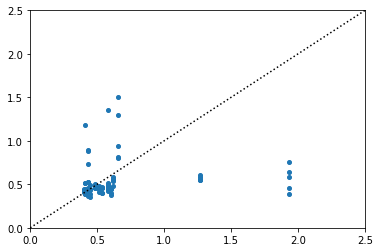

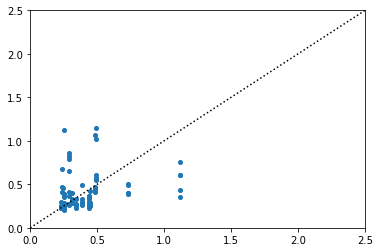

In [59]:
xx1 = 0
xx2 = 2.5
# plt.plot(fwhms,fwhms_likely, 'o')
# plt.plot([0,3],[0,3], 'k:')
# plt.xlim(xx1,xx2)
# plt.ylim(xx1,xx2)
# plt.show()

plt.plot(fwhms_t,fwhms_likely, 'o')
plt.plot([0,3],[0,3], 'k:')
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.show()

plt.plot(fwhms2_t,fwhms_likely2, 'o')
plt.plot([0,3],[0,3], 'k:')
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.show()

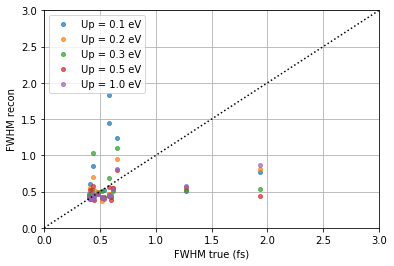

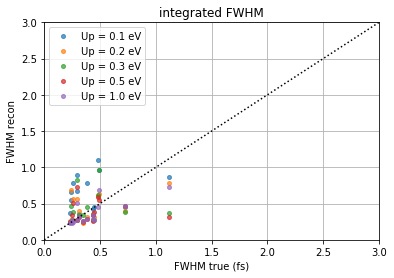

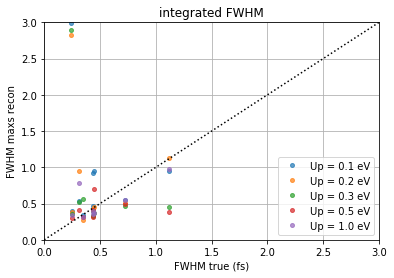

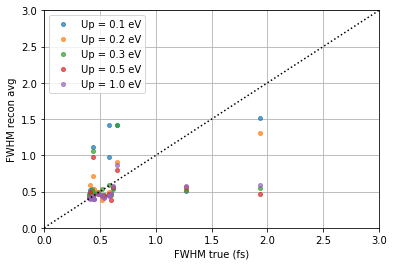

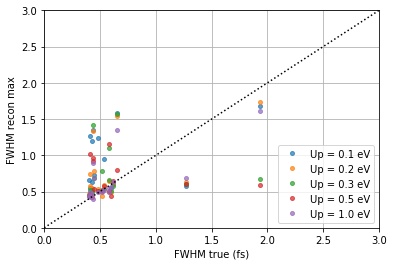

...

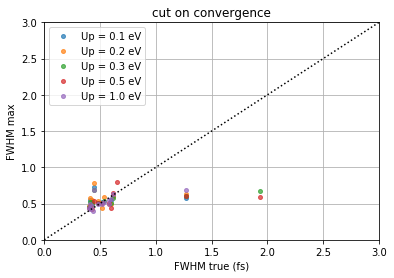

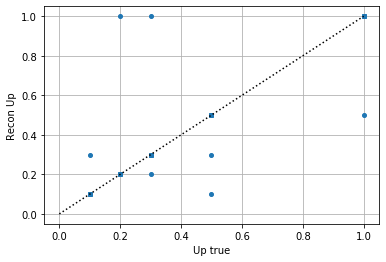

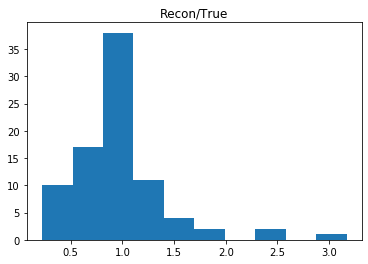

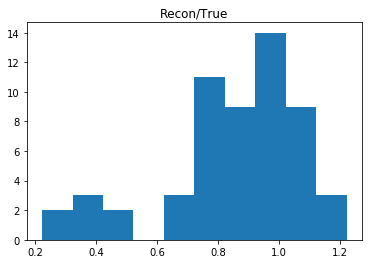

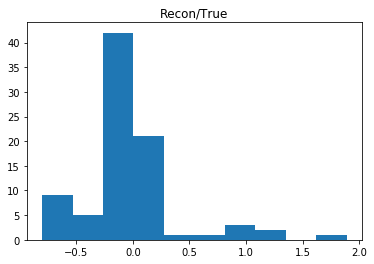

In [64]:
xx1 = 0
xx2 = 3
fwhms_t = np.array(fwhms_t)
fwhms_avg = np.array(fwhms_avg)
fwhms_maxs = np.array(fwhms_maxs)
fwhms = np.array(fwhms)
fwhms2 = np.array(fwhms2)
fwhms2_t = np.array(fwhms2_t)
fwhms2_maxs = np.array(fwhms2_maxs)
fwhms_likely = np.array(fwhms_likely)
fwhms_likely2 = np.array(fwhms_likely2)
ups_t = np.array(ups_t)
ups_b = np.array(ups_b)
std_t = np.array(std_t)
std_t_no_w = np.array(std_t_no_w)
fwhms_tup_fit = np.array(fwhms_tup_fit)

for u in np.unique(ups_t):
    plt.plot(fwhms_t[ups_t == u], fwhms[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon')
plt.grid()
plt.show()


for u in np.unique(ups_t):
    plt.plot(fwhms2_t[ups_t == u], fwhms2[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon')
plt.title('integrated FWHM')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    plt.plot(fwhms2_t[ups_t == u], fwhms2_maxs[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM maxs recon')
plt.title('integrated FWHM')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    plt.plot(fwhms_t[ups_t == u], fwhms_avg[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon avg')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    plt.plot(fwhms_t[ups_t == u], fwhms_maxs[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon max')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    plt.plot(fwhms[ups_t == u], fwhms_avg[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM recon (fs)')
plt.ylabel('FWHM recon avg')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    plt.plot(fwhms[ups_t == u], fwhms2[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM recon (fs)')
plt.ylabel('FWHM integrated')
plt.grid()
plt.show()


for u in np.unique(ups_t):
    plt.plot(fwhms_t[ups_t == u], fwhms2_t[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM true integrated')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    std_thresh = 80
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon')
plt.grid()
plt.show()

for u in np.unique(ups_t):
    std_thresh = 80
    plt.plot(fwhms2_t[(ups_t == u) & (std_t < std_thresh)], fwhms2[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.title('cut on convergence, integrated FWHM')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon')
plt.grid()
plt.show()



for u in np.unique(ups_t):
    std_thresh = 80
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms_maxs[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,xx2)
plt.ylim(xx1,xx2)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM max')
plt.grid()
plt.show()

# for u in np.unique(ups_t):
#     if u == 0: plt.plot([],[])
#     if u>0: plt.plot(fwhms_t[ups_t == u], fwhms[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
# plt.legend()
# plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
# plt.xlim(0.2,2)
# plt.ylim(0.2,2.)
# plt.plot([0,2],[0,2], 'k:')
# plt.xlabel('FWHM true (fs)')
# plt.ylabel('FWHM recon')
# plt.grid()
# plt.show()

plt.plot(ups_t, ups_b, 'o')
plt.xlabel('Up true')
plt.ylabel('Recon Up')
plt.plot([0,1],[0,1], 'k:')
plt.grid()
plt.show()


# plt.plot(fwhms_tup_fit[ups_t == ups_b],fwhms[ups_t == ups_b],'o', label = 'true is best fit')
# plt.plot(fwhms_tup_fit[ups_t != ups_b],fwhms[ups_t != ups_b],'x', label = 'true not best fit')
# plt.xlabel('FWHM true Up')
# plt.ylabel('FWHM Recon Up')
# plt.plot([0,2],[0,2], 'k:')
# plt.xlim(0.2,1.4)
# plt.ylim(0.2,1.4)
# plt.grid()
# plt.legend()
# plt.show()

plt.hist(fwhms/np.squeeze(fwhms_t))
plt.title('Recon/True')
plt.show()


plt.hist(fwhms[std_t < std_thresh]/np.squeeze(fwhms_t[std_t < std_thresh]))
plt.title('Recon/True')
plt.show()

plt.hist(((fwhms_likely-np.squeeze(fwhms_t))/np.squeeze(fwhms_t)))
plt.title('Recon/True')
plt.show()

# plt.hist(fwhms[ups_t != 0]/np.squeeze(fwhms_t[ups_t != 0]))
# plt.title('Recon/True')
# plt.show()

In [ ]:
for u in [0.1,0.2,0.3,0.5,1.0]:
    std_thresh = 50 #30
    plt.plot(fwhms_t[(ups_t == u) & (std_t_no_w < std_thresh)], fwhms[(ups_t == u)& (std_t_no_w < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()

for u in [0.1,0.2,0.3,0.5,1.0]:
    plt.plot(fwhms_t[(ups_t == u) & (std_t_no_w < std_thresh)], fwhms_likely[(ups_t == u)& (std_t_no_w < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed most likely FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()


for u in [0.1,0.2,0.3,0.5,1.0]:
    plt.plot(fwhms2_t[(ups_t == u) & (std_t_no_w < std_thresh)], fwhms_likely2[(ups_t == u)& (std_t_no_w < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed integrated (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()

for u in [0.1,0.2,0.3,0.5,1.0]:
    plt.plot(fwhms_t[(ups_t == u) & (std_t_no_w < std_thresh)], fwhms_maxs[(ups_t == u)& (std_t_no_w < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed max FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()
print('also need to cut on number of completed seeds')

plt.hist(((fwhms_likely[(ups_t == u) & (std_t_no_w < std_thresh)]-np.squeeze(fwhms_t)[(ups_t == u) & (std_t_no_w < std_thresh)])/np.squeeze(fwhms_t)[(ups_t == u) & (std_t_no_w < std_thresh)]))
plt.title('likely percent error')
plt.show()

plt.hist(((fwhms_likely2[(ups_t == u) & (std_t_no_w < std_thresh)]-np.squeeze(fwhms2_t)[(ups_t == u) & (std_t_no_w < std_thresh)])/np.squeeze(fwhms2_t)[(ups_t == u) & (std_t_no_w < std_thresh)]))
plt.title('integrated percent error')
plt.show()

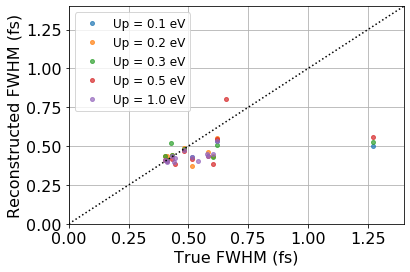

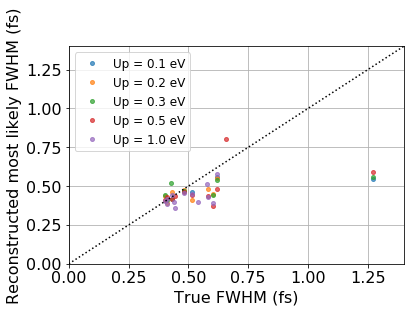

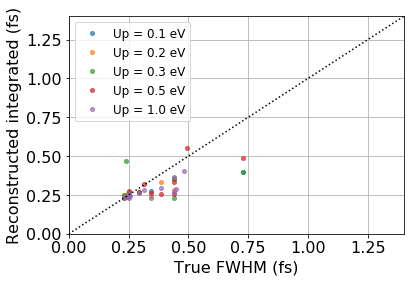

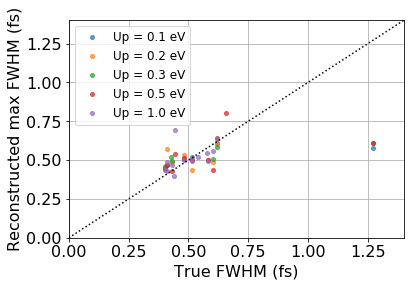

also need to cut on number of completed seeds


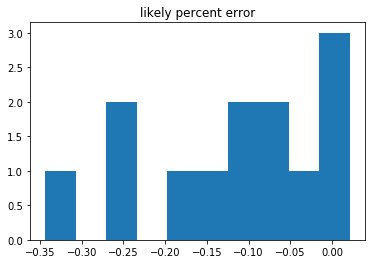

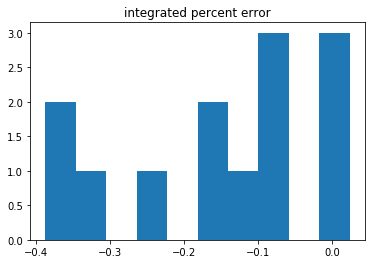

In [66]:
for u in [0.1,0.2,0.3,0.5,1.0]:
    std_thresh = 50 #30
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()

for u in [0.1,0.2,0.3,0.5,1.0]:
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms_likely[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed most likely FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()


for u in [0.1,0.2,0.3,0.5,1.0]:
    plt.plot(fwhms2_t[(ups_t == u) & (std_t < std_thresh)], fwhms_likely2[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed integrated (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()

for u in [0.1,0.2,0.3,0.5,1.0]:
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms_maxs[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 12)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed max FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()
print('also need to cut on number of completed seeds')

plt.hist(((fwhms_likely[(ups_t == u) & (std_t < std_thresh)]-np.squeeze(fwhms_t)[(ups_t == u) & (std_t < std_thresh)])/np.squeeze(fwhms_t)[(ups_t == u) & (std_t < std_thresh)]))
plt.title('likely percent error')
plt.show()

plt.hist(((fwhms_likely2[(ups_t == u) & (std_t < std_thresh)]-np.squeeze(fwhms2_t)[(ups_t == u) & (std_t < std_thresh)])/np.squeeze(fwhms2_t)[(ups_t == u) & (std_t < std_thresh)]))
plt.title('integrated percent error')
plt.show()

In [69]:
np.mean((fwhms_likely[(ups_t == u) & (std_t < std_thresh)]-np.squeeze(fwhms_t)[(ups_t == u) & (std_t < std_thresh)])/np.squeeze(fwhms_t)[(ups_t == u) & (std_t < std_thresh)])

-0.11768275751072718

In [68]:
np.mean((fwhms_likely2[(ups_t == u) & (std_t < std_thresh)]-np.squeeze(fwhms2_t)[(ups_t == u) & (std_t < std_thresh)])/np.squeeze(fwhms2_t)[(ups_t == u) & (std_t < std_thresh)])


-0.1513284726485695

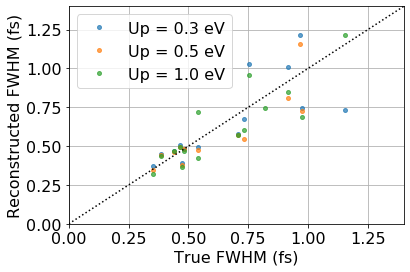

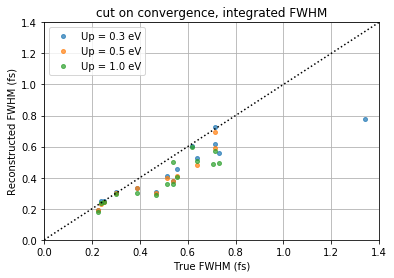

In [42]:
for u in [0.3,0.5,1.0]:
    std_thresh = 60
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms_maxs[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend(fontsize = 16)
#plt.title('cut on convergence')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)',fontsize = 16)
plt.ylabel('Reconstructed FWHM (fs)',fontsize = 16)
plt.grid()
plt.gca().tick_params(axis='both', which='both', labelsize=16)
plt.show()

for u in [0.3,0.5,1.0]:
    std_thresh = 60
    plt.plot(fwhms2_t[(ups_t == u) & (std_t < std_thresh)], fwhms2[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.title('cut on convergence, integrated FWHM')
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(xx1,1.4)
plt.ylim(xx1,1.4)
plt.plot([0,3],[0,3], 'k:')
plt.xlabel('True FWHM (fs)')
plt.ylabel('Reconstructed FWHM (fs)')
plt.grid()
plt.show()


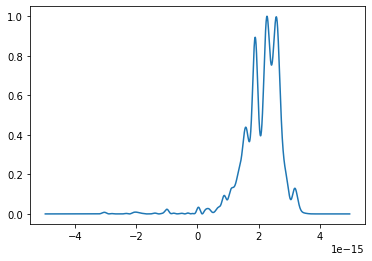

In [152]:
Qt = trueQs[IDs[-5]]
Ett = np.squeeze(np.matmul(Qt.T,alpha_t))
EttEtt = np.abs(Ett*Ett.conj())
EttEtt = EttEtt/np.max(EttEtt)
plt.plot(ts, EttEtt)

def FWHM_rms(t,spec):
    spec = np.roll(spec,int(len(spec)/2)-np.argmax(spec))
    integral = np.trapz(spec**2,t)
    rms = np.sqrt(1/(t[-1]-t[0])*integral)
    return rms

In [ ]:
check = EttEtt
#check[check<0.2] = 0
FWHM(ts*1e15,check)
FWHM2(ts*1e15,check)
FWHM_rms(ts*1e15,check)*1.36

In [43]:
Ew = np.squeeze(np.matmul(Qguess.T,alphw)) 
EwEw = np.real(Ew*Ew.conj())
#EwEw = EwEw[1340-eVshift_idx:-1340-eVshift_idx]
EwEw = EwEw/np.max(EwEw)
len(EwEw)

2801

In [44]:
len(EwtEwt)

2801

In [46]:
s = np.load('/cds/home/p/paris/reconVMI_clean/recon X510 Dec/specs_Dec16.npy')[()]

(-20, 20)

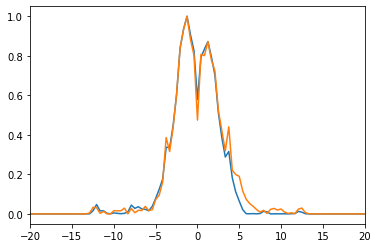

In [45]:
plt.plot(eV[1340:-1340],EwEw[1340:-1340])
plt.plot(eV[1340:-1340],EwtEwt[1340:-1340])
plt.xlim(-20,20)

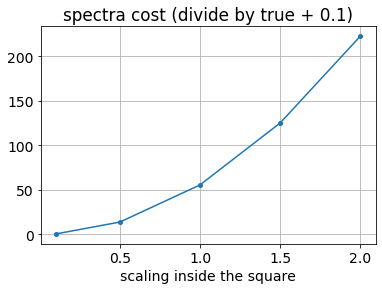

In [118]:
scale = [0.1, 0.5, 1, 1.5, 2] #[1, 2, 5, 8, 10, 12.5, 15] #, 20, 30, 40]
cs = []
for i in range(len(scale)): 
    #cs.append(np.sum(np.abs(scale[i]*(EwEw[1340:-1340]-EwtEwt[1340:-1340]))**2))
    cs.append(np.sum(np.abs(scale[i]*(EwEw[1340:-1340]-EwtEwt[1340:-1340])/(0.1+EwtEwt[1340:-1340]))**2))
    
plt.plot(scale,cs,'-o')
plt.title('spectra cost (divide by true + 0.1)')
plt.xlabel('scaling inside the square')
plt.grid()

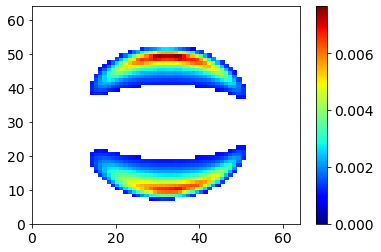

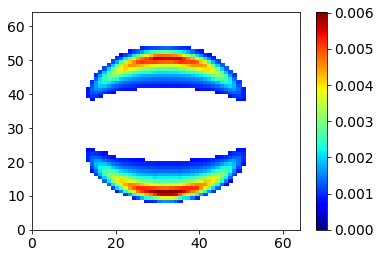

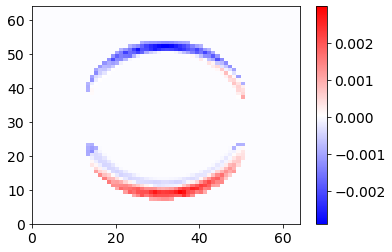

In [112]:
pscale = 1/np.max(m/np.sum(m*mask))
Mt = m/np.sum(m*mask)*pscale
Mp = pscale*np.reshape(Mgr/np.sum(mask*np.reshape(Mgr, [64,64])), [64,64])

plt.pcolormesh(Mt/pscale, cmap = my_cmap)
plt.colorbar()
plt.show()
plt.pcolormesh(Mp/pscale, cmap = my_cmap)
plt.colorbar()
plt.show()
plt.pcolormesh((Mt-Mp)/pscale*mask, cmap = 'bwr')
plt.colorbar()

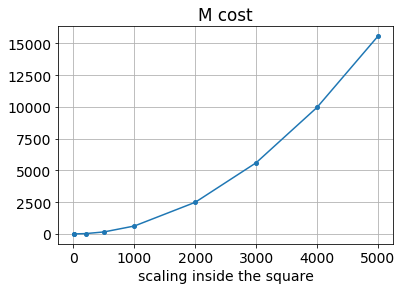

In [113]:
scale = [1, 2, 200, 500, 1000, 2000, 3000, 4000, 5000]
cs = []
for i in range(len(scale)): 
    cs.append(np.sum(np.abs(scale[i]*(Mt-Mp)/pscale*mask)**2))
    
plt.plot(scale,cs,'-o')
plt.title('M cost')
plt.xlabel('scaling inside the square')
plt.grid()

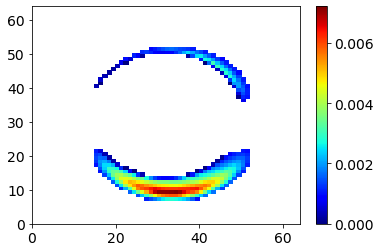

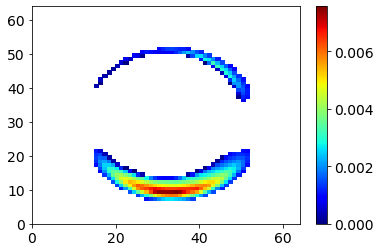

In [72]:
plt.pcolormesh(merr, cmap = my_cmap)
plt.colorbar()
plt.show()
plt.pcolormesh(mgrerr, cmap = my_cmap)
plt.colorbar()
plt.show()

In [ ]:
fwhms_t = np.array(fwhms_t)
fwhms = np.array(fwhms)
ups_t = np.array(ups_t)
ups_b = np.array(ups_b)
std_t = np.array(std_t)
fwhms_tup_fit = np.array(fwhms_tup_fit)

for u in np.unique(ups_t):
    plt.plot(fwhms_t[ups_t == u], fwhms[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(0.2,1.5)
plt.ylim(0.2,1.5)
plt.plot([0,2],[0,2], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon')
plt.grid()
plt.show()


for u in np.unique(ups_t):
    std_thresh = 100
    plt.plot(fwhms_t[(ups_t == u) & (std_t < std_thresh)], fwhms[(ups_t == u)& (std_t < std_thresh)], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
plt.legend()
plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
plt.xlim(0.2,1.5)
plt.ylim(0.2,1.5)
plt.plot([0,2],[0,2], 'k:')
plt.xlabel('FWHM true (fs)')
plt.ylabel('FWHM recon')
plt.grid()
plt.show()

# for u in np.unique(ups_t):
#     if u == 0: plt.plot([],[])
#     if u>0: plt.plot(fwhms_t[ups_t == u], fwhms[ups_t == u], 'o', alpha = 0.7, label = 'Up = %1.1f eV' %u)
# plt.legend()
# plt.ylim(plt.gca().get_ylim()[0],plt.gca().get_ylim()[1])
# plt.xlim(0.2,2)
# plt.ylim(0.2,2.)
# plt.plot([0,2],[0,2], 'k:')
# plt.xlabel('FWHM true (fs)')
# plt.ylabel('FWHM recon')
# plt.grid()
# plt.show()

plt.plot(ups_t, ups_b, 'o')
plt.xlabel('Up true')
plt.ylabel('Recon Up')
plt.plot([0,1],[0,1], 'k:')
plt.grid()
plt.show()


# plt.plot(fwhms_tup_fit[ups_t == ups_b],fwhms[ups_t == ups_b],'o', label = 'true is best fit')
# plt.plot(fwhms_tup_fit[ups_t != ups_b],fwhms[ups_t != ups_b],'x', label = 'true not best fit')
# plt.xlabel('FWHM true Up')
# plt.ylabel('FWHM Recon Up')
# plt.plot([0,2],[0,2], 'k:')
# plt.xlim(0.2,1.4)
# plt.ylim(0.2,1.4)
# plt.grid()
# plt.legend()
# plt.show()

plt.hist(fwhms/np.squeeze(fwhms_t))
plt.title('Recon/True')
plt.show()

plt.hist(fwhms[std_t < std_thresh]/np.squeeze(fwhms_t[std_t < std_thresh]))
plt.title('Recon/True')
plt.show()

# plt.hist(fwhms[ups_t != 0]/np.squeeze(fwhms_t[ups_t != 0]))
# plt.title('Recon/True')
# plt.show()

In [ ]:
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.zeros((1024,1024))
maskhm[(rs>325-24) & (rs<420)]=1
#maskhm[(rs>325-42/2) & (rs<430+42/2)]=1 #12 eV around where unstreaked photoline is
#maskhm[(rs>318) & (rs<430+42/2)]=1
mask = rebin(rebin(maskhm,4),4)

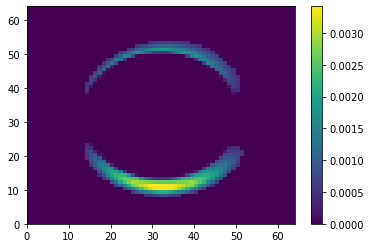

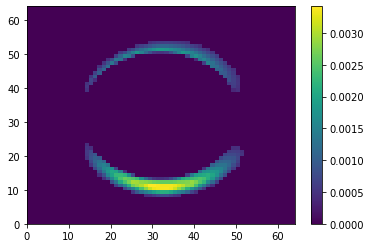

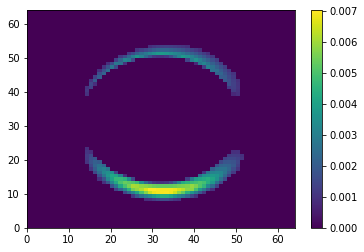

In [92]:
n = 3
plt.pcolormesh(mdat[n]/np.sum(mdat[n])*mask)
plt.colorbar()
plt.show()

nn = mdat[n]/np.sum(mdat[n])*mask
nn[nn<0.00037] = 0
plt.pcolormesh(nn)
plt.colorbar()
plt.show()

nn = nn/np.sum(nn)
plt.pcolormesh(nn)
plt.colorbar()
plt.show()

In [102]:
Bp = Bp_basis
Q1=Q[0:N_basis]
Q1=np.reshape(Q1,[1,N_basis])
Q2=np.concatenate(([0],Q[N_basis:2*N_basis-1]))
Q2=np.reshape(Q2,[1,N_basis])
Qguess=Q1+1j*Q2
Qguess=np.reshape(Qguess,[N_basis,1])
Mgr=np.real(np.matmul(np.matmul(Qguess,Qguess.conj().transpose()).transpose().flatten(),Bp))
Mgr=Mgr/np.sum(Mgr)
# Mgr[Mgr<0.0005] = 0
Mgr[Mgr<0.00037] = 0
Mgr=Mgr/np.sum(Mgr)

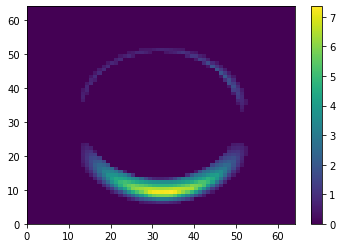

In [109]:
plt.pcolormesh(np.reshape(Mgr,[64,64])*1000)
plt.colorbar()

In [101]:
i = -1
Np = 128
Up = Ups[i]  
filename = 'Bpbasis_Np' + str(Np) + '_Nw' + str(N_w) +'_Nt' + str(N_t) + '_Up' + str(Up)+'.npy'
print(filename)
br = np.load(basesdir+filename, allow_pickle=True)
Breal = br[()]['Breal']
Bimag = br[()]['Bimag']
breal = br[()]['breal']
bimag = br[()]['bimag']
vNaxis = br[()]['vNaxis']
alpha = br[()]['alpha']


tempr = np.zeros((Breal.shape[0], 64**2))
tempi = np.zeros((Breal.shape[0], 64**2))
for i in range(len(Breal)):
    tempr[i,:] = np.reshape(rebin(np.reshape(Breal[i,:], [128,128])), [64**2])
    tempi[i,:] = np.reshape(rebin(np.reshape(Bimag[i,:], [128,128])), [64**2])

Breal = tempr
Bimag = tempi

alphw = np.zeros(alpha['t_sample'].shape, dtype = complex)
for i in range(len(alphw)):
    f = interp1d(vNaxis['t_sample'], alpha['t_sample'][i], fill_value = 0, bounds_error = False)
    N = 2801 #1024
    ts = np.linspace(vNaxis['t_sample'][0],-vNaxis['t_sample'][0], N)
    alphw[i] = np.fft.ifftshift(np.fft.ifft(f(ts)))

Np = 64
for j in range(Breal.shape[0]):
    temp=np.reshape(Breal[j,:],[Np,Np])
    polimg = PR.cart2pol(temp,32,32)
    bb = np.zeros((64,64))
    bb[1:64,1:64]= PR.pol2cart(scimg.filters.gaussian_filter(polimg,[gfsig,0]))
    Breal[j,:]=np.reshape(bb*mask,newshape=(1,Np**2))
    #temp=scimg.filters.gaussian_filter(temp,0.8889)
    #Bpr[j,:]=Variable(Tensor(np.reshape(temp,newshape=(1,Np**2))))
    temp=np.reshape(Bimag[j,:],[Np,Np])
    polimg = PR.cart2pol(temp,32,32)
    bb = np.zeros((64,64))
    bb[1:64,1:64]= PR.pol2cart(scimg.filters.gaussian_filter(polimg,[gfsig,0]))
    Bimag[j,:]=np.reshape(bb*mask,newshape=(1,Np**2))
    #temp=scimg.filters.gaussian_filter(temp,0.8889)
    #Bpi[j,:]=Variable(Tensor(np.reshape(temp,newshape=(1,Np**2))))

Bp_basis = Breal+1j*Bimag

Bpbasis_Np128_Nw6_Nt6_Up1.0.npy


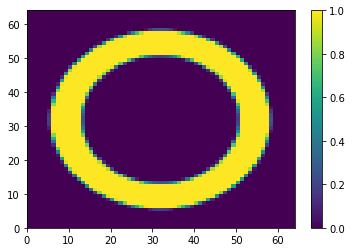

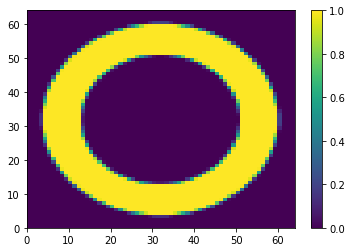

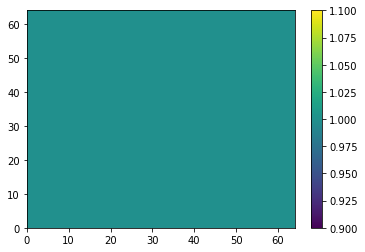

In [69]:
X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.zeros((1024,1024))
maskhm[(rs>325-24) & (rs<420)]=1
#maskhm[(rs>325-42/2) & (rs<430+42/2)]=1 #12 eV around where unstreaked photoline is
#maskhm[(rs>318) & (rs<430+42/2)]=1
mask = rebin(rebin(maskhm,4),4)
plt.pcolormesh(mask)
plt.colorbar()
plt.show()

X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.zeros((1024,1024))
maskhm[(rs>325-42/2) & (rs<430+42/2)]=1 #12 eV around where unstreaked photoline is
#maskhm[(rs>318) & (rs<430+42/2)]=1
mask = rebin(rebin(maskhm,4),4)
plt.pcolormesh(mask)
plt.colorbar()
plt.show()

X,Y=np.meshgrid(np.arange(1024),np.arange(1024))
rs=np.sqrt((X-512)**2+(Y-512)**2)
maskhm=np.ones((1024,1024))
#maskhm[(rs>325-24) & (rs<420)]=1

mask = rebin(rebin(maskhm,4),4)
plt.pcolormesh(mask)
plt.colorbar()
plt.show()